# Clustering

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import sklearn.manifold as skm
from collections import OrderedDict
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn import preprocessing
from astropy.stats import sigma_clip
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

We want to see if the features we have defined make the chains of the protein separate naturally into clusters. We perform a `DBSCAN` clustering on our data, previously projected into 2D and 3D plane using `t-SNE`.

In [2]:
'''Importing Data'''

y = np.loadtxt('labels.txt', dtype = str)
path = 'coord_prot.txt'
prot = pd.read_csv(path, header=None)
prot['label'] = y
prot = prot.sort_values(by=['label'],ignore_index=True)
prot = prot.dropna()
prot = prot[prot.label != 'nan']

x = prot[prot.columns[0:15]]
x = np.array(x)
y = prot['label']
y = np.array(y)

## Data processing

We clean the data in order to neglect some outliers. 

Plotting each feature for each chain, we can see that there are some points that have an extreme order of magnitude w.r.t. the typical order of magnitude of that feature.

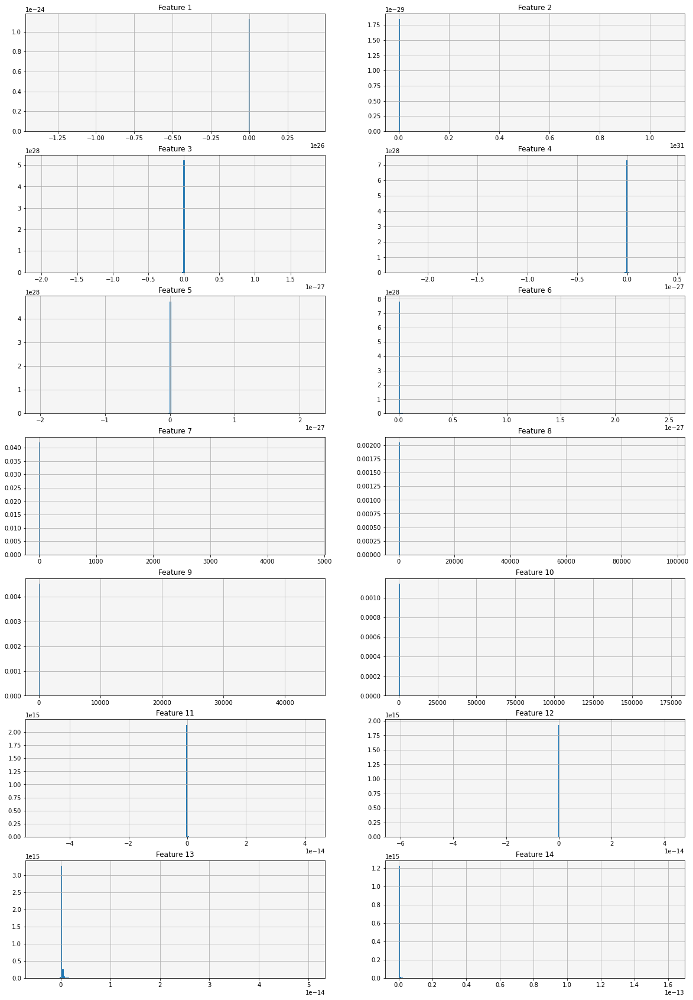

In [3]:
fig, axes = plt.subplots(7,2,figsize=(20,30))
k = 0
l = 0
for i in range(1,15):
    axes[l,k].set_title("Feature %d" %i)
    axes[l,k].set_facecolor("whitesmoke") 
    pos = i
    axes[l,k].hist(x[:,pos], bins = 200, density = True)
    axes[l,k].grid()
    k += 1
    if k != 0 and k %2== 0:
        l += 1
        k  = 0

Using the `sigma_clip` module for each them, the algorithm reject values that are less or more than a specified number of standard deviations (**3**) from the center value.

In [4]:
'''Cleaning Data'''

x = sigma_clip(x, sigma=3, masked=False, axis=0)
y = y[~np.isnan(x).any(axis=1)]
x = x[~np.isnan(x).any(axis=1)]

print("X shape after truncation: ", x.shape) 
print("y shape after truncation: ", y.shape)

X shape after truncation:  (73772, 15)
y shape after truncation:  (73772,)


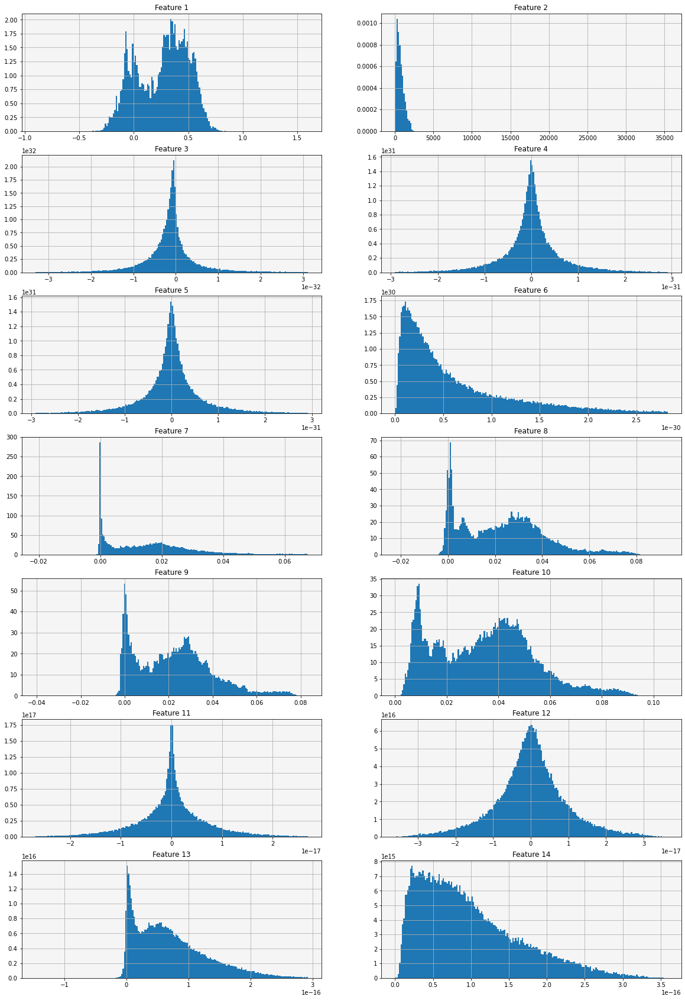

In [5]:
fig, axes = plt.subplots(7,2,figsize=(20,30))
k = 0
l = 0
for i in range(1,15):
    axes[l,k].set_title("Feature %d" %i)
    axes[l,k].set_facecolor("whitesmoke") 
    pos = i
    axes[l,k].hist(x[:,pos], bins = 200, density = True)
    axes[l,k].grid()
    k += 1
    if k != 0 and k %2== 0:
        l += 1
        k  = 0

We want to do a clustering for the C class, leaving out the $4$ and $6$ classes because they have very few samples.

Let's define our labels and the indices of the classes.

In [9]:
y_true = np.zeros(y.shape,dtype=int)
y = y[y != 'nan']
for i in range(len(y)):

    g = y[i].split('.')
    g = g[0]
    y_true[i] = int(g)

In [10]:
_, counts = np.unique(y_true, return_counts = True)
c1 = counts[0]
c2 = c1 + counts[1]
c3 = c2 + counts[2]
c4 = c3 + counts[3]
c6 = c4 + counts[4]

In [11]:
x_1 = x[:c3, :]
y_label = y_true[:c3]
uniqs, counts = np.unique(y_label,return_counts= True)
print("Labels in class C: ", uniqs)
print("Number of proteins in each label: ", counts)

Labels in class C:  [1 2 3]
Number of proteins in each label:  [14498 22318 36588]


`StandardScaler` transformation.

In [12]:
x_standard = StandardScaler().fit_transform(x_1)

### t-SNE in 2D

`t-SNE` in 2D with different values of perplexity. The best one result will be the input of the `DBSCAN`.

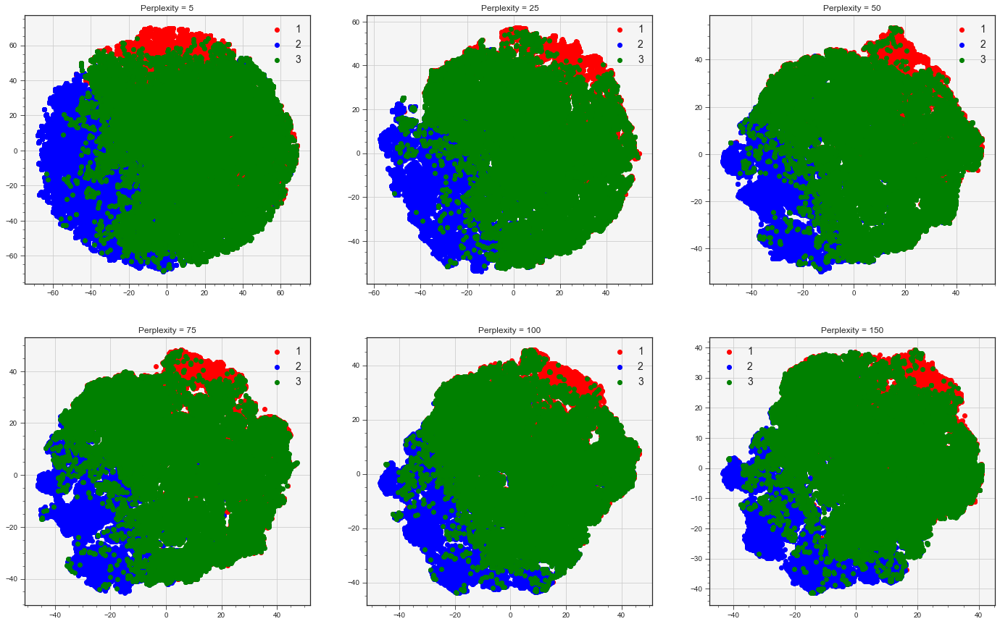

In [11]:
plt.style.use('seaborn-ticks')
perplexity=[5,25,50,75,100,150]
fig, axes =plt.subplots(2,3,figsize=(24,15))
k=0
j=0

for i in perplexity:
    data_embedded2D = skm.TSNE(n_components=2,perplexity=i,random_state=0).fit_transform(x_standard) 
    axes[j,k].scatter(data_embedded2D[:c1,0],data_embedded2D[:c1,1],label='1', c='red')
    axes[j,k].scatter(data_embedded2D[c1:c2,0],data_embedded2D[c1:c2,1],label='2', c='blue')
    axes[j,k].scatter(data_embedded2D[c2:,0],data_embedded2D[c2:,1],label='3', c='green') 
    axes[j,k].legend(fontsize=14,loc='best')
    axes[j,k].minorticks_on()
    axes[j,k].set_facecolor("whitesmoke")
    axes[j,k].grid()
    axes[j,k].set_title("Perplexity = " + str(i))
    
    k += 1
    if k!=0 and k%3==0:
        j += 1
        k  = 0

### t-SNE in 3D

Just for the interactive visualization.

In [10]:
data_embedded= skm.TSNE(n_components=3,perplexity=25,random_state=0).fit_transform(x_standard)

In [11]:
data_embedded = np.column_stack((data_embedded, y_label))

color = ['red', 'blue','green']
fig = go.Figure(data=[go.Scatter3d(
    x=data_embedded[:,0],
    y=data_embedded[:,1],
    z=data_embedded[:,2],
    mode='markers',
    marker=dict(
        size=2,
        color = data_embedded[:,3],
        colorscale = 'Viridis',   # choose a colorscale
        opacity = 0.8
    )
)])

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

## DBSCAN

Working on the clipped-scaled data, we project them in 2 dimensions and we calculate the distance from each point to its closest two neighbours.
We plot the result and we find the optimal value for $\epsilon$ paramenter at the point of maximum curvature in the following plot.

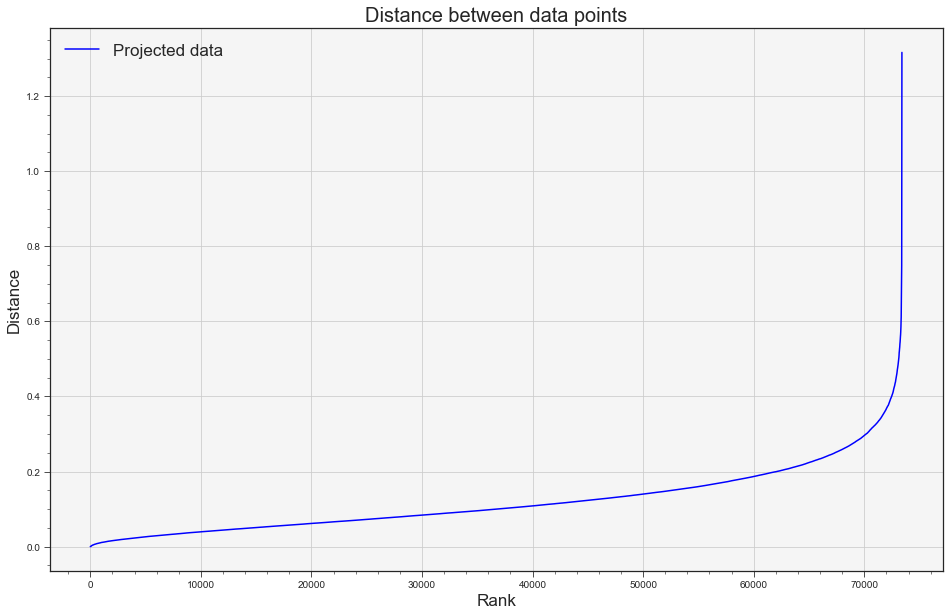

In [51]:
new_variable_scaled_lin = StandardScaler().fit_transform(x_1)
X = skm.TSNE(n_components=2,perplexity=25,random_state=0).fit_transform(new_variable_scaled_lin)

#Metric used: euclidean
#Number of neighbors assumed=2
neigh = NearestNeighbors(n_neighbors=3, metric="euclidean")

nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)
distances = np.sort(distances, axis=0)
distances = distances[:,1]

plt.figure(figsize=(16,10))
plt.style.use('seaborn-ticks')
plt.minorticks_on()
plt.xlabel('Rank',fontsize=17)
plt.ylabel('Distance',fontsize=17)
plt.plot(distances, color='blue', label='Projected data')
ax = plt.axes()
ax.set_facecolor("whitesmoke")
plt.grid()
plt.title("Distance between data points", fontsize =20)
plt.legend(fontsize=17,loc="best")
plt.show()

In [52]:
cpalette = ["#1CE6FF", "#FF34FF", "#FF4A46","#008941", "#006FA6", "#A30059", "#0000A6", "#63FFAC","#B79762", "#004D43", "#8FB0FF", "#997D87","#5A0007", "#809693","#1B4400", "#4FC601", "#3B5DFF", "#4A3B53","#886F4C","#34362D", "#B4A8BD", "#00A6AA", "#452C2C","#636375", "#A3C8C9", "#FF913F", "#938A81","#575329", "#00FECF", "#B05B6F"]

def plotting_ax(X, y, ax):
    plt.style.use('seaborn-ticks')
    ax.set_facecolor("whitesmoke")
    # Plotting function
    for i, yu in enumerate(np.unique(y)):
        pos = (y == yu)   
        ax.minorticks_on()
        ax.scatter(X[pos,0], X[pos,1], c=cpalette[i%len(cpalette)], s=8)

def clustering(y):
    # Finds position of labels and returns a dictionary of cluster labels to data indices.
    yu = np.sort(np.unique(y))
    clustering = OrderedDict()
    for ye in yu:
        clustering[ye] = np.where(y == ye)[0]
    return clustering

def entropy(c, n_sample):
    # Measures the entropy of a cluster
    h = 0.
    for kc in c.keys():
        p = len(c[kc])/n_sample
        h += p*np.log(p)
    h *= -1.
    return h
    
def NMI(y_true, y_pred):
    # Computes normalized mutual information: where y_true and y_pred are both clustering assignments
    w = clustering(y_true)
    c = clustering(y_pred)
    n_sample = len(y_true)

    Iwc = 0.
    for kw in w.keys():
        for kc in c.keys():
            w_intersect_c = len(set(w[kw]).intersection(set(c[kc])))
            if w_intersect_c > 0:
                Iwc += w_intersect_c*np.log(n_sample*w_intersect_c/(len(w[kw])*len(c[kc])))
    Iwc /= n_sample
    Hc = entropy(c,n_sample)
    Hw = entropy(w,n_sample)
    return 2*Iwc/(Hc+Hw)

Let's perform a `DBSCAN` on the dataset to see if the features make the chains separate into $3$ clusters based on the density.

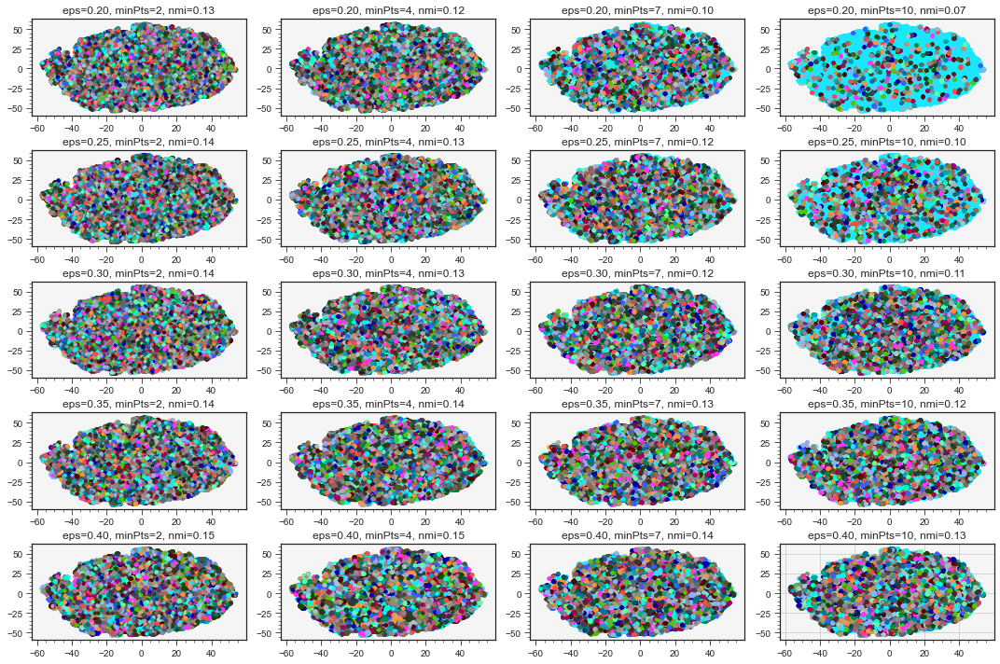

In [61]:
eps_range = [0.2,0.25,0.3,0.35,0.4]
min_sample_range = [2,4,7,10]

fig, ax = plt.subplots(len(eps_range),len(min_sample_range),figsize=(15,10))
for i, eps in enumerate(eps_range):
    for j, min_samples in enumerate(min_sample_range):
        ax[i,j].set_facecolor("whitesmoke")
        plt.style.use('seaborn-ticks')
        model = DBSCAN(eps=eps, min_samples=min_samples)
        model.fit(X)
        y_fake = model.labels_
        plotting_ax(X,y_fake,ax[i,j])
        nmi = NMI(y_fake, y_label)
        n_clusters_ = len(set(y_fake)) - (1 if -1 in y_fake else 0)
        ax[i,j].set_title('eps=%.2f, minPts=%i, nmi=%.2f'%(eps,min_samples,nmi))
plt.tight_layout(h_pad=0.5)
plt.grid()
plt.show()

We can clearly see that `DBSCAN` algorithm does not work for our dataset. We have tried to explore different `eps_values` in the previous plots also changing the `min_samples` parameter.
Basically the algorithm is not able to recognize our clusters.

## KNeighborsClassifier

This is the best algorithm to classify the protein chains. Later we will show that this method reaches a very good score using the features of the original paper.

In [13]:
k = [1, 2, 3, 4, 5, 6,7,8,9]
# Size of the test set
size = 0.1

In [14]:
acc = []

for ki in k:
    X_train, X_test, y_train, y_test = train_test_split(x_standard, y_label, test_size=size, random_state=4)

    # Train Model and Predict
    neigh = KNeighborsClassifier(n_neighbors = ki, weights= 'distance', algorithm = 'brute').fit(X_train,y_train)
    Pred_y = neigh.predict(X_test)
    acc.append(metrics.accuracy_score(y_test, Pred_y))

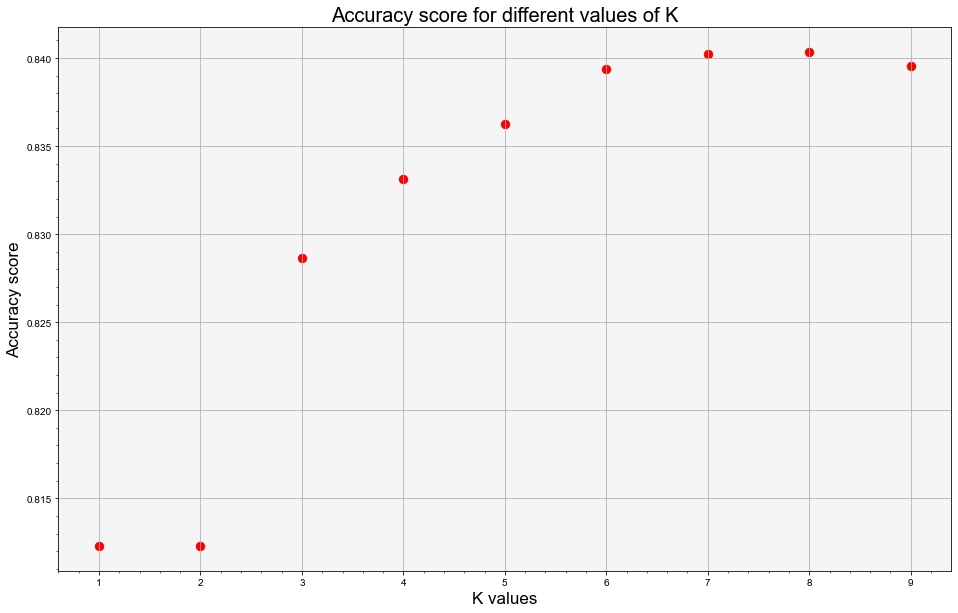

In [15]:
plt.figure(figsize=(16, 10))

plot=plt.scatter(k,acc, color="red", s = 70)
plt.xlabel('K values',fontsize=17)
plt.style.use('seaborn-ticks')
plt.minorticks_on()
plt.ylabel('Accuracy score', fontsize=17)
ax = plt.axes()
ax.set_facecolor("whitesmoke")
plt.title("Accuracy score for different values of K",fontsize =20)
plt.grid()
plt.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=7f8dc80d-b049-402a-8ce8-c9485c5001f5' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>